In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm
from heatmap import heatmap, corrplot
import sctop as top

In [2]:
sns.set(context='talk', color_codes=True, palette='deep', style='whitegrid',
        rc={'mathtext.fontset': 'cm', 'xtick.direction': 'in','ytick.direction': 'in',
            'axes.linewidth': 1.5, 'figure.dpi':400, 'text.usetex':False}) #font_scale=0.3,

from matplotlib.cm import ScalarMappable

def create_colorbar(data, label, colormap='rocket_r', ax = None, cax = None, pad = 0.1):
    ax = ax or plt.gca()
    
    cmap = plt.get_cmap(colormap)
    scalarmap = ScalarMappable(norm=plt.Normalize(min(data), max(data)),
                               cmap=cmap)
    scalarmap.set_array([])
    cb_ax = plt.colorbar(scalarmap, label=label, ax=ax, cax=cax, fraction=0.03, pad=pad)
    
    return cb_ax

In [3]:
def load(basis_name, minimum_cells = 100):
    source_dir = '../sctop/databases/'
    data = pd.read_hdf(source_dir + 'data_' + basis_name + '.h5')
    metadata = pd.read_csv(source_dir + 'metadata_' + basis_name + '.csv', index_col=0)
    
    # if Mouse Cell Atlas, drop cultured mesenchymal and trophoblast stem cells
    # ALso drop embroynic cells, because we only want an adult basis
    if 'MC' in basis_name:
        exceptions = [exception for exception in data.columns 
                      if ('Trophoblast' in exception) or ('Cultured' in exception) or ('E14.5' in exception) or ('Embryonic' in exception)]
        data = data.drop(columns = exceptions)
        metadata = metadata.drop(index = exceptions)
        
    types_above_minimum = metadata['Cell Count'] > minimum_cells
    
    return (data.loc[:, types_above_minimum].dropna(axis=0), metadata.loc[types_above_minimum])

In [4]:
basis, basis_metadata = load('MC20_apr22')

In [5]:
rawdata_herriges = pd.read_csv('./21_01_06_herriges_with_week6_invivo.csv')
metadata_herriges = pd.read_csv('./herriges_metadata.csv')

# Michael's labels for each of the clusters
cluster_key = {'2':'AT1 and AT1-like',
               '4':'Ciliated',
               '6':'Basal',
               '7':'Gastric-like',
               '8':'Neuroendocrine',
               '0+':'AT2',
               '1+13':'Secretory',
               '3+14':'AT2-like'}

clusters = metadata_herriges['new_clustering.07.12.2021'].values
cluster_labels = [cluster_key[cluster] for cluster in clusters]
identity = metadata_herriges['orig.ident'].values

type_annotations = np.array(cluster_labels)

type_annotations[type_annotations == 'AT2'] = 'AT2 and AT2-like' 
type_annotations[type_annotations == 'AT2-like'] = 'AT2 and AT2-like' 

# Sources for each of the cells
source_annotations = []

for label in identity:
    if 'Transplant' in label:
        source_annotations += ['Transplant']
    elif 'Endogenous' in label:
        source_annotations += ['Endogenous']
    elif 'Control' in label:
        source_annotations += ['Control']
        
source_annotations = np.array(source_annotations)

# Figure 1 (d)

In [6]:
condition = np.logical_and(type_annotations == 'AT1 and AT1-like', source_annotations == 'Control')
processed = top.process(rawdata_herriges.loc[:, condition], average=True)
scores = top.score(basis, processed)

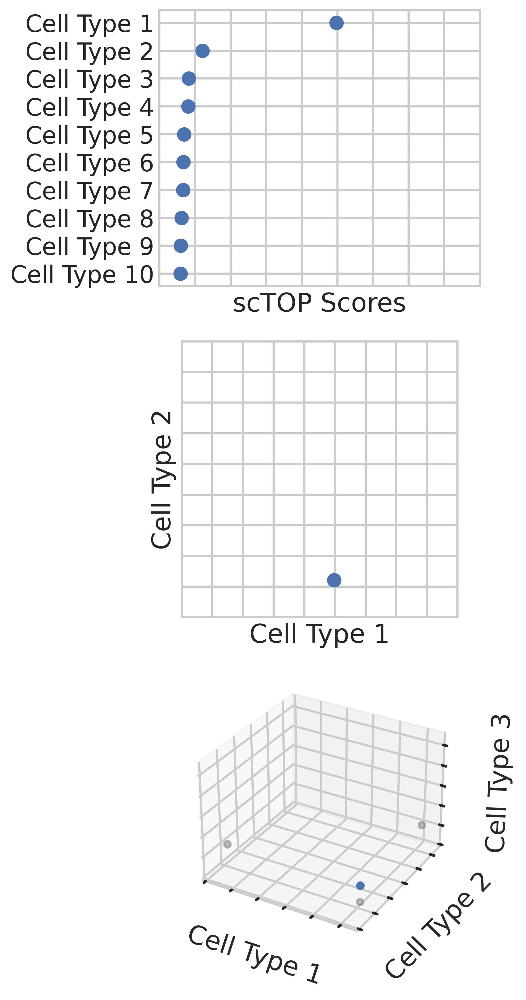

In [8]:
fig = plt.figure(figsize=plt.figaspect(3))
n = 10
projections_sorted = scores.sort_values(by=scores.columns[0])
projections_top = projections_sorted.iloc[-n:]

ax = fig.add_subplot(3, 1, 1)
ax.plot(projections_top.values, projections_top.index, 'o')
# ax.hlines(y = projections_top.index, xmin = 0, xmax = projections_top.values)
# ax.set_title('Projections of aggregated AT1 cells')
ax.set_xlabel('scTOP Scores')
# ax.grid()
ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax.set_yticks(range(10))
ax.set_yticklabels(['Cell Type {}'.format(10-y) for y in range(10)])
ax.set_xticks(np.arange(10)/10.)

ax = fig.add_subplot(3, 1, 2)
ax.plot(scores.loc['Lung AT1 Cell WK6-10 MC20'], scores.loc['Lung AT2 Cell WK6-10 MC20'], 'o')
ax.set_xlabel('Cell Type 1')
ax.set_ylabel('Cell Type 2')
# ax.set_title('Projections of aggregated AT1 cells')
ax.set_xlim([0, 0.55])
ax.set_ylim([0, 0.55])
ax.set_aspect('equal')
# ax.grid()
ax.set_xticks(np.arange(10)/10.)
ax.set_yticks(np.arange(10)/10.)
ax.tick_params(axis='both', which='both', labelbottom=False, labeltop=False, labelright=False, labelleft=False)

ax = fig.add_subplot(3, 1, 3, projection='3d')
ax.scatter(scores.loc['Lung AT1 Cell WK6-10 MC20'], scores.loc['Lung AT2 Cell WK6-10 MC20'], scores.loc['Pancreas Ductal Cell WK6-10 MC20'])

# Shadows
ax.scatter(scores.loc['Lung AT1 Cell WK6-10 MC20'], np.full_like(scores.loc['Lung AT1 Cell WK6-10 MC20'], 0.55), scores.loc['Pancreas Ductal Cell WK6-10 MC20'], color='grey', alpha=0.5)
ax.scatter(scores.loc['Lung AT1 Cell WK6-10 MC20'], scores.loc['Lung AT2 Cell WK6-10 MC20'], np.full_like(scores.loc['Lung AT1 Cell WK6-10 MC20'],0), color='grey', alpha=0.5)
ax.scatter(np.full_like(scores.loc['Lung AT1 Cell WK6-10 MC20'], 0), scores.loc['Lung AT2 Cell WK6-10 MC20'], scores.loc['Pancreas Ductal Cell WK6-10 MC20'], color='grey', alpha=0.5)

ax.set_xlabel('Cell Type 1')
ax.set_ylabel('Cell Type 2')
ax.set_zlabel('Cell Type 3')
ax.tick_params(axis='both', which='both', labelbottom=False, labeltop=False, labelright=False, labelleft=False)
ax.set_xticks(np.arange(10)/10.)
ax.set_yticks(np.arange(10)/10.)
ax.set_zticks(np.arange(10)/10.)
# ax.set_title('Projections of aggregated AT1 cells')

ax.set_xlim([0, 0.55])
ax.set_ylim([0, 0.55])
ax.set_zlim([0, 0.55])

# plt.tight_layout()

plt.savefig("fig1d.pdf", transparent=True, bbox_inches = "tight")

plt.show()

# Figure 1 (e)

In [10]:
condition = np.logical_and(type_annotations == 'AT1 and AT1-like', source_annotations == 'Control')
processed_all = top.process(rawdata_herriges.loc[:, condition], average=False)
scores_all = top.score(basis, processed_all)

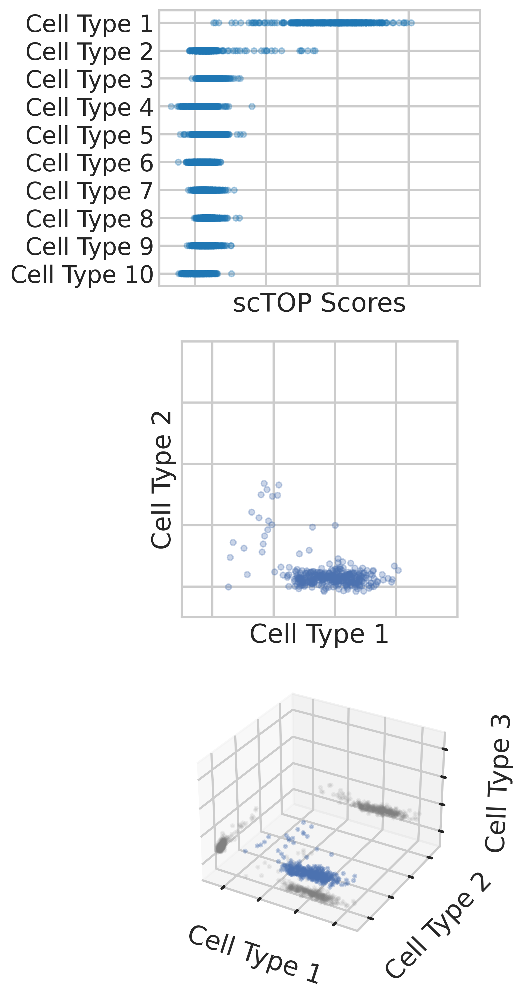

In [11]:
fig = plt.figure(figsize=plt.figaspect(3))
n = 10
projections_sorted = scores.sort_values(by=scores.columns[0])
projections_top = projections_sorted.iloc[-n:]

ax = fig.add_subplot(3, 1, 1)
ax.plot(scores_all.loc[projections_top.index].values, projections_top.index, 'o', color='tab:blue', alpha=0.3, markersize=4)
ax.set_xlabel('scTOP Scores')
# ax.grid()
ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
ax.set_yticks(range(10))
ax.set_yticklabels(['Cell Type {}'.format(10-y) for y in range(10)])
ax.set_xticks(np.arange(5)/10.)

ax = fig.add_subplot(3, 1, 2)
ax.plot(scores_all.loc['Lung AT1 Cell WK6-10 MC20'], scores_all.loc['Lung AT2 Cell WK6-10 MC20'], 'o', alpha=0.3, markersize=4)
ax.set_xlabel('Cell Type 1')
ax.set_ylabel('Cell Type 2')
# ax.set_title('Projections of aggregated AT1 cells')
ax.set_xlim([-0.05, 0.35])
ax.set_ylim([-0.05, 0.35])
ax.set_aspect('equal')
# ax.grid()
ax.set_xticks(np.arange(5)/10.)
ax.set_yticks(np.arange(5)/10.)
ax.tick_params(axis='both', which='both', labelbottom=False, labeltop=False, labelright=False, labelleft=False)

ax = fig.add_subplot(3, 1, 3, projection='3d')
ax.scatter(scores_all.loc['Lung AT1 Cell WK6-10 MC20'], scores_all.loc['Lung AT2 Cell WK6-10 MC20'], scores_all.loc['Pancreas Ductal Cell WK6-10 MC20'], alpha=0.3, s=4)

# Shadows
ax.scatter(scores_all.loc['Lung AT1 Cell WK6-10 MC20'], np.full_like(scores_all.loc['Lung AT1 Cell WK6-10 MC20'], 0.35), scores_all.loc['Pancreas Ductal Cell WK6-10 MC20'], color='grey', alpha=0.1, s=4)
ax.scatter(scores_all.loc['Lung AT1 Cell WK6-10 MC20'], scores_all.loc['Lung AT2 Cell WK6-10 MC20'], np.full_like(scores_all.loc['Lung AT1 Cell WK6-10 MC20'],-0.05), color='grey', alpha=0.1, s=4)
ax.scatter(np.full_like(scores_all.loc['Lung AT1 Cell WK6-10 MC20'], -0.05), scores_all.loc['Lung AT2 Cell WK6-10 MC20'], scores_all.loc['Pancreas Ductal Cell WK6-10 MC20'], color='grey', alpha=0.1, s=4)

ax.set_xlabel('Cell Type 1')
ax.set_ylabel('Cell Type 2')
ax.set_zlabel('Cell Type 3')
ax.tick_params(axis='both', which='both', labelbottom=False, labeltop=False, labelright=False, labelleft=False)
ax.set_xticks(np.arange(5)/10.)
ax.set_yticks(np.arange(5)/10.)
ax.set_zticks(np.arange(5)/10.)
# ax.set_title('Projections of aggregated AT1 cells')

ax.set_xlim([-0.05, 0.35])
ax.set_ylim([-0.05, 0.35])
ax.set_zlim([-0.05, 0.35])

# plt.tight_layout()

plt.savefig("fig1e.pdf", transparent=True, bbox_inches = "tight", dpi=300)

plt.show()

# Figure 2 (a)

In [7]:
data_herriges = top.process(rawdata_herriges)
projections_herriges = top.score(basis, data_herriges)

In [7]:
subset = np.logical_and(type_annotations=='AT2 and AT2-like', source_annotations=='Control')
AT2 = rawdata_herriges.loc[:,subset]

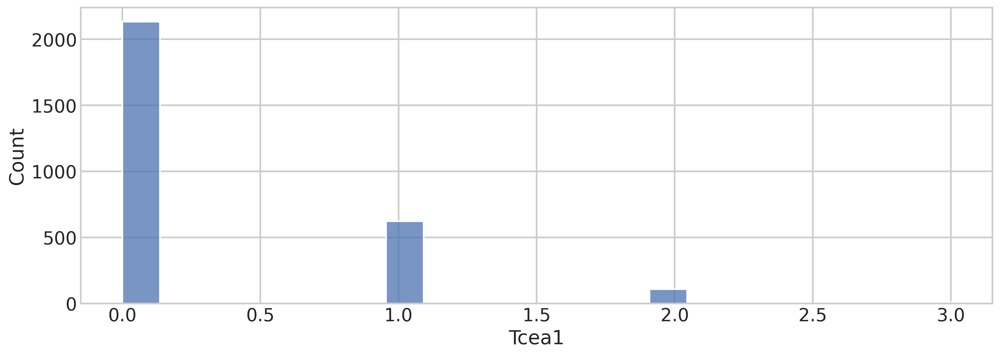

In [8]:
plt.figure(figsize=(15, 5))
gene_values = AT2.iloc[4]
sns.histplot(gene_values)
plt.show()

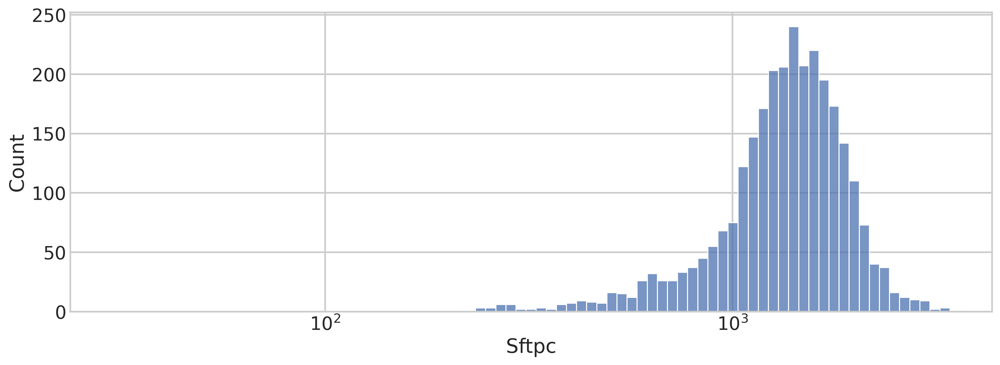

In [11]:
plt.figure(figsize=(15, 5))
gene_values = AT2.loc['Sftpc']
sns.histplot(gene_values + 1, log_scale=True)
plt.show()

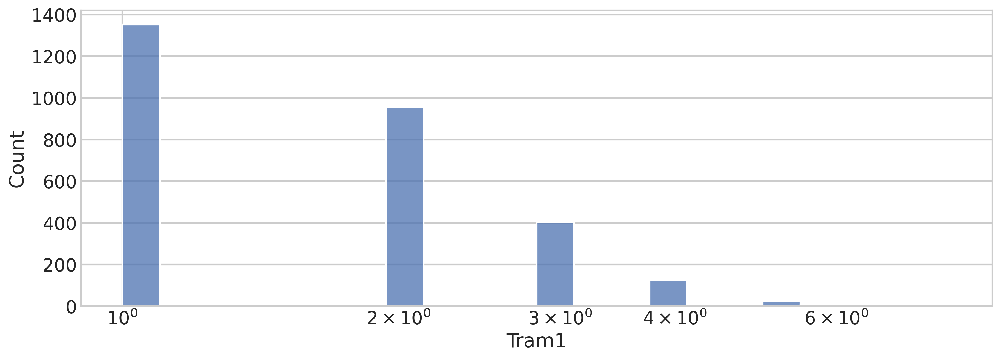

In [14]:
plt.figure(figsize=(15, 5))
gene_values = AT2.iloc[30]
sns.histplot(gene_values + 1, log_scale=True)
plt.show()

In [8]:
color_dict = {'AT1 and AT1-like': 'tab:blue',
              'AT2 and AT2-like': 'tab:orange',
              'Basal': 'tab:green',
              'Ciliated': 'tab:red',
#               'Gastric-like': 'tab:purple',
              'Neuroendocrine': 'tab:brown',
              'Secretory': 'tab:pink'
            }

marker_dict = {'AT1 and AT1-like': 'o',
               'AT2 and AT2-like': '^',
               'Basal': 's',
               'Ciliated': 'P',
               'Gastric-like': 'X',
               'Neuroendocrine': 'D',
               'Secretory': '*'
              } 

In [8]:
accuracies = pd.DataFrame(index=color_dict.keys(), columns=['top1', 'top3', 'unspecified', 'total_cells'])

accuracy_dict = {'AT1 and AT1-like': 'Lung AT1 Cell WK6-10 MC20',
                 'AT2 and AT2-like': 'Lung AT2 Cell WK6-10 MC20',
                 'Basal': 'Unspecified',
                 'Ciliated': 'Lung Ciliated Cell WK6-10 MC20',
                 'Neuroendocrine': 'Unspecified',
                 'Secretory': 'Lung Club Cell WK6-10 MC20'
                }

# Record numbers of cells with maximum score less than 0.1
# We will call these "unspecified"

condition = source_annotations=='Control'

for current_type, correct_type in accuracy_dict.items():
    subset = np.logical_and(type_annotations==current_type, condition)
    scores = projections_herriges.loc[:,subset]
    
    top1 = 0
    top3 = 0
    unspecified = 0
    total_cells = scores.shape[1]
    
    for cell_label, cell_scores in scores.iteritems():
        sorted_scores = cell_scores.sort_values(ascending=False)
        if sorted_scores.index[0] == correct_type:
            top1 += 1
        if correct_type in sorted_scores.index[:3]:
            top3 +=1
        if sorted_scores[0] < 0.1:
            unspecified +=1
    
    accuracies.loc[current_type] = {'top1': top1,
                                    'top3': top3,
                                    'unspecified': unspecified,
                                    'total_cells': total_cells
                                   }

In [144]:
accuracies

,top1,top3,unspecified,total_cells
AT1 and AT1-like,338,350,8,354
AT2 and AT2-like,2864,2872,5,2872
Basal,0,0,66,67
Ciliated,386,388,3,389
Neuroendocrine,0,0,70,75
Secretory,1082,1184,113,1190


In [151]:
accuracies_limited = accuracies.drop(['Basal', 'Neuroendocrine'])

print('Overall top1: {:f}'.format(accuracies_limited.loc[:,'top1'].sum()/accuracies_limited.loc[:,'total_cells'].sum()))
print('Overall top3: {:f}'.format(accuracies_limited.loc[:,'top3'].sum()/accuracies_limited.loc[:,'total_cells'].sum()))
print('Overall unspecified: {:f}'.format(accuracies_limited.loc[:,'unspecified'].sum()/accuracies_limited.loc[:,'total_cells'].sum()))

Overall top1: 0.971904
Overall top3: 0.997711
Overall unspecified: 0.026847


In [154]:
basis_metadata.loc[[accuracy_dict['Secretory'], accuracy_dict['AT1 and AT1-like'], accuracy_dict['AT2 and AT2-like']]]

,Organ,Cell Type,Time Point,Source,Cell Count
Lung Club Cell WK6-10 MC20,Lung,Club Cell,WK6-10,MC20,165
Lung AT1 Cell WK6-10 MC20,Lung,AT1 Cell,WK6-10,MC20,163
Lung AT2 Cell WK6-10 MC20,Lung,AT2 Cell,WK6-10,MC20,2020


In [6]:
from matplotlib.cm import ScalarMappable

def create_colorbar(data, label, colormap='rocket_r', ax = None, cax = None, pad = 0.1):
    ax = ax or plt.gca()
    
    cmap = plt.get_cmap(colormap)
    scalarmap = ScalarMappable(norm=plt.Normalize(min(data), max(data)),
                               cmap=cmap)
    scalarmap.set_array([])
    cb_ax = plt.colorbar(scalarmap, label=label, ax=ax, cax=cax, fraction=0.03, pad=pad)
    
    return cb_ax

NameError: name 'gene' is not defined

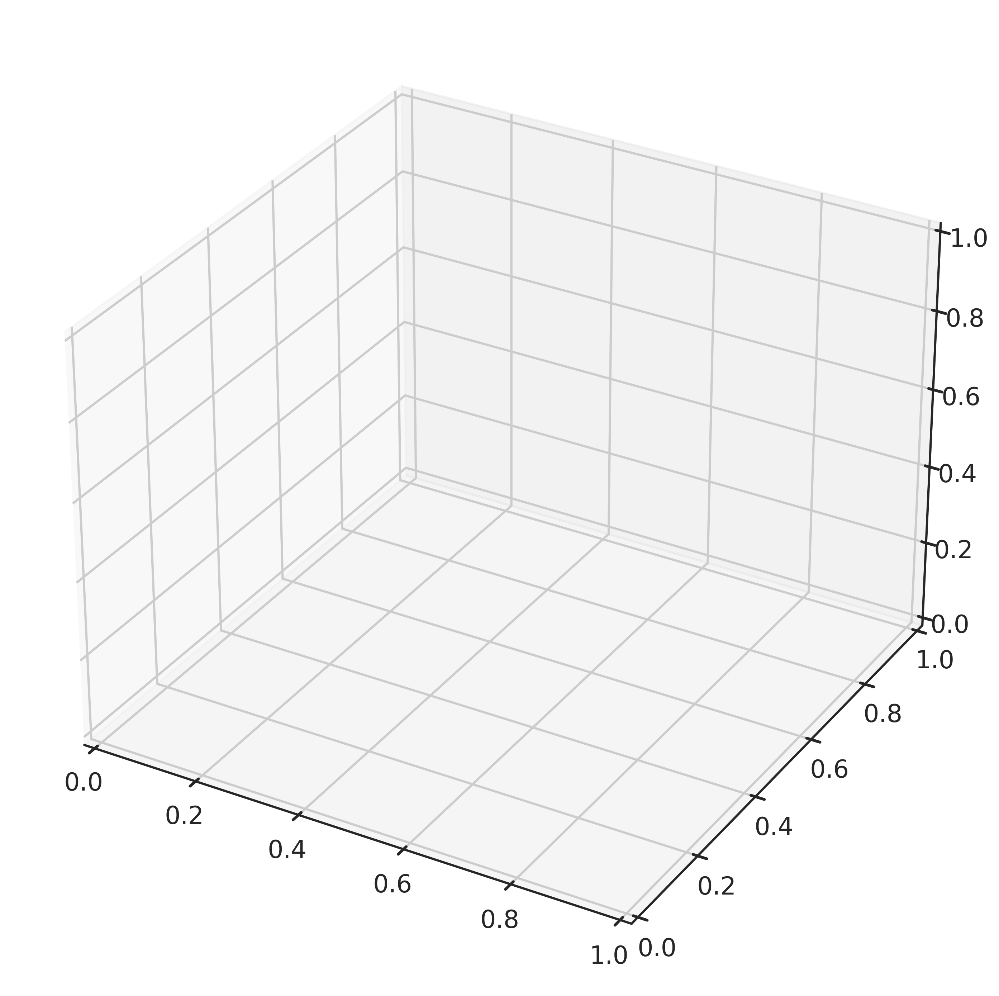

In [67]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1, 1, 1, projection='3d')

type1 = 'Lung AT1 Cell WK6-10 MC20'
type2 = 'Lung AT2 Cell WK6-10 MC20'
type3 = 'Lung Ciliated Cell WK6-10 MC20'
markersize = plt.rcParams['lines.markersize'] **2
bounds = [-0.05, 0.35]

cmap = create_colorbar(data_herriges.loc[gene], '{} expression (z-score)'.format(gene),
                       colormap='rocket', ax = ax)

condition = source_annotations=='Control'
# scores = projections_herriges.loc[:,condition]
# annotations = type_annotations[condition]
# colors = [color_dict[celltype] for celltype in annotations]
# markers = [marker_dict[celltype] for celltype in annotations]

for cell_type in color_dict.keys():
    subset = np.logical_and(type_annotations==cell_type, condition)
    # Only plot [maximum_cells] cells for each cell type
    maximum_cells = 50
    number_cells = len(np.where(subset)[0])
    if maximum_cells > number_cells:
        maximum_cells = number_cells
    
    scores = projections_herriges.loc[:,subset]
    scores = scores.iloc[:,:maximum_cells]
    
    kwargs = {'s':markersize,
              'marker':marker_dict[cell_type]
             }
    
    label = cell_type
    if 'like' in label:
        label = label[:label.index(' and')]
    
#     ax.scatter(scores.loc[type1], scores.loc[type2], scores.loc[type3],
#                alpha=0.35, c=color_dict[cell_type], label=label, **kwargs)

    gene = 'Sftpc'
    gene_expressions = rawdata_herriges.loc[gene]
    gene_subset = gene_expressions.loc[subset]
    gene_subset = gene_subset.iloc[:maximum_cells]
    
    ax.scatter(scores.loc[type1], scores.loc[type2], scores.loc[type3],
               alpha=0.35, c=gene_subset.values, cmap = cmap,
                      label=label, **kwargs)
    
    
    ax.scatter(scores.loc[type1],
               np.full_like(scores.loc[type2], bounds[1]),
               scores.loc[type3],
               color='grey', alpha=0.05, **kwargs)
#                color=color_dict[cell_type], alpha=0.05, **kwargs, edgecolors='grey')
    ax.scatter(scores.loc[type1],
               scores.loc[type2],
               np.full_like(scores.loc[type3], bounds[0]),
               color='grey', alpha=0.05, **kwargs)
    ax.scatter(np.full_like(scores.loc[type1], bounds[0]),
               scores.loc[type2],
               scores.loc[type3],
               color='grey', alpha=0.05, **kwargs)

ax.set_xlabel(type1, labelpad=10)
ax.set_ylabel(type2, labelpad=10)
ax.set_zlabel(type3, labelpad=10)
# ax.tick_params(axis='both', which='both', pad=0)#labelbottom=False, labeltop=False, labelright=False, labelleft=False)
ax.set_xticks(np.arange(5)/10.)
ax.set_yticks(np.arange(5)/10.)
ax.set_zticks(np.arange(5)/10.)

ax.set_xlim(bounds)
ax.set_ylim(bounds)
ax.set_zlim(bounds)

# plt.legend(bbox_to_anchor=(1.04,0.8), loc="upper left", title='True type (all lung)')

# plt.savefig("./manuscript figures/fig2a_lung_marker.pdf", transparent=True, bbox_inches = "tight")

plt.show()

In [24]:
import random
type1 = basis.columns[random.randint(0, len(basis.columns))]
type2 = basis.columns[random.randint(0, len(basis.columns))]
type3 = basis.columns[random.randint(0, len(basis.columns))]

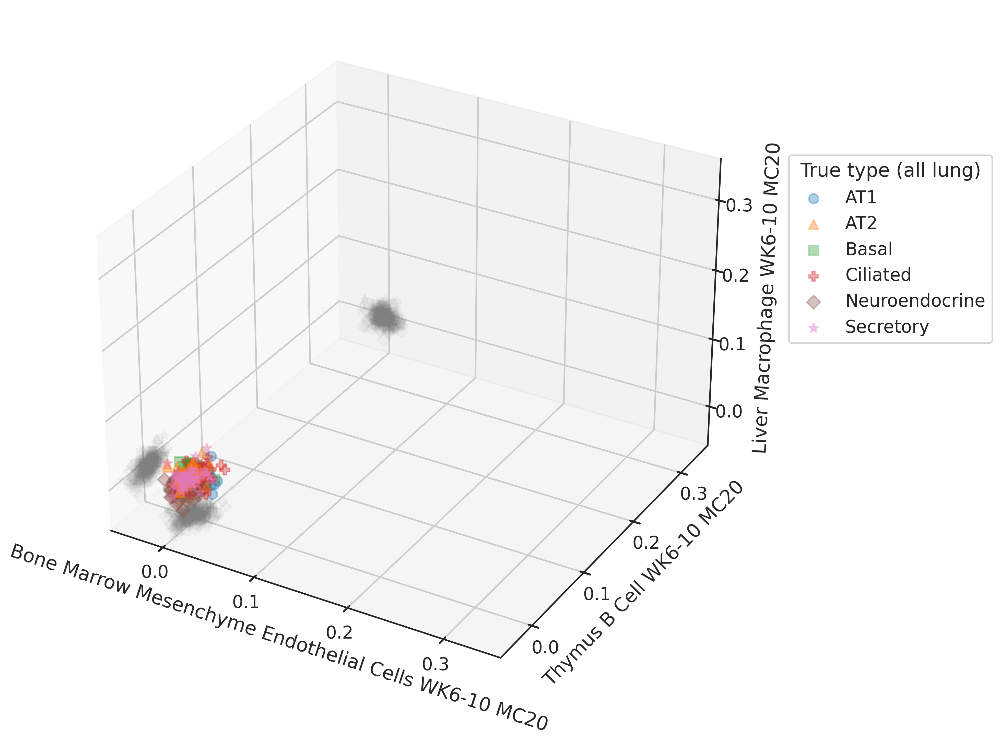

In [26]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1, 1, 1, projection='3d')

# type1 = basis.columns.sample(1)
# type2 = basis.columns.sample(1)
# type3 = basis.columns.sample(1)
markersize = plt.rcParams['lines.markersize'] ** 2
bounds = [-0.05, 0.35]

condition = source_annotations=='Control'
# scores = projections_herriges.loc[:,condition]
# annotations = type_annotations[condition]
# colors = [color_dict[celltype] for celltype in annotations]
# markers = [marker_dict[celltype] for celltype in annotations]

for cell_type in color_dict.keys():
    subset = np.logical_and(type_annotations==cell_type, condition)
    # Only plot [maximum_cells] cells for each cell type
    maximum_cells = 50
    number_cells = len(np.where(subset)[0])
    if maximum_cells > number_cells:
        maximum_cells = number_cells
    
    scores = projections_herriges.loc[:,subset]
    scores = scores.iloc[:,:maximum_cells]
    
    kwargs = {'s':markersize,
              'marker':marker_dict[cell_type]
             }
    
    label = cell_type
    if 'like' in label:
        label = label[:label.index(' and')]
    
    ax.scatter(scores.loc[type1], scores.loc[type2], scores.loc[type3],
               alpha=0.35, c=color_dict[cell_type], label=label, **kwargs)
    
    ax.scatter(scores.loc[type1],
               np.full_like(scores.loc[type2], bounds[1]),
               scores.loc[type3],
               color='grey', alpha=0.05, **kwargs)
#                color=color_dict[cell_type], alpha=0.05, **kwargs, edgecolors='grey')
    ax.scatter(scores.loc[type1],
               scores.loc[type2],
               np.full_like(scores.loc[type3], bounds[0]),
               color='grey', alpha=0.05, **kwargs)
    ax.scatter(np.full_like(scores.loc[type1], bounds[0]),
               scores.loc[type2],
               scores.loc[type3],
               color='grey', alpha=0.05, **kwargs)

ax.set_xlabel(type1, labelpad=10)
ax.set_ylabel(type2, labelpad=10)
ax.set_zlabel(type3, labelpad=10)
# ax.tick_params(axis='both', which='both', pad=0)#labelbottom=False, labeltop=False, labelright=False, labelleft=False)
ax.set_xticks(np.arange(5)/10.)
ax.set_yticks(np.arange(5)/10.)
ax.set_zticks(np.arange(5)/10.)

ax.set_xlim(bounds)
ax.set_ylim(bounds)
ax.set_zlim(bounds)

plt.legend(bbox_to_anchor=(1.04,0.8), loc="upper left", title='True type (all lung)')

# plt.tight_layout()

# plt.savefig("./manuscript figures/fig2a_random.pdf", transparent=True, bbox_inches = "tight")

plt.show()

In [10]:
label_dict = {'Lung AT1 Cell WK6-10 MC20': 'AT1',
              'Lung AT2 Cell WK6-10 MC20': 'AT2',
              'Lung Ciliated Cell WK6-10 MC20': 'Ciliated',
             }

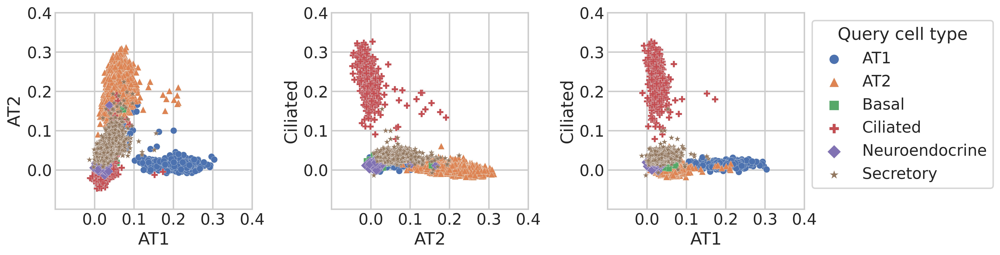

In [16]:
fig = plt.figure(figsize=(15,5))
type1 = 'Lung AT1 Cell WK6-10 MC20'
type2 = 'Lung AT2 Cell WK6-10 MC20'
type3 = 'Lung Ciliated Cell WK6-10 MC20'
markersize = plt.rcParams['lines.markersize'] **1.75
bounds = [-0.1, 0.35]
condition = source_annotations=='Control'

type_pairs = [[type1, type2], [type2, type3], [type1, type3]]

for index, type_pair in enumerate(type_pairs):
    ax = fig.add_subplot(1, 3, index+1)
    typeX, typeY = type_pair
    
    for cell_type in color_dict.keys():
        subset = np.logical_and(type_annotations==cell_type, condition)
        current_data = projections_herriges.loc[:,subset]
        
        label = cell_type
        if 'like' in label:
            label = label[:label.index(' and')]
        
        sns.scatterplot(x=current_data.loc[typeX],
                        y=current_data.loc[typeY],
#                         hue=current_data.loc[type_hue],
        #                 alpha=0.8,
#                         style = current_data.loc[type_hue],
        #                 legend=False,
#                         palette='inferno_r',
                        marker = marker_dict[cell_type],
                        linewidth=0.15,
                        s = markersize,
                        ax=ax,
                        label=label
                       )
        
    ax.set(xlabel = label_dict[typeX],
           ylabel = label_dict[typeY],
           xlim = bounds,
           ylim = bounds,
           aspect = 'equal',
           xticks = np.arange(5)/10.,
           yticks = np.arange(5)/10.
          )
    if (index+1)%3 != 0:
        ax.get_legend().remove()
    else:
        legend = ax.legend(bbox_to_anchor=(1,1), loc="upper left", title='Query cell type', scatterpoints=1)
        for legend_entry in legend.legendHandles:
            legend_entry._sizes = [100]
    
plt.tight_layout()

plt.savefig("./manuscript figures/fig2a_2D.png", transparent=True, bbox_inches = "tight")
plt.show()

In [17]:
type_signatures = pd.read_csv('./manuscript data/herriges_cell_type_signatures.csv')
type_signatures = type_signatures.dropna(how='all')

AT1_signature = type_signatures.loc[:, 'Mouse_AT1'].dropna()
AT2_signature = type_signatures.loc[:, 'Mouse_AT2'].dropna()
ciliated_signature = type_signatures.loc[:, 'Mouse_Ciliated'].dropna()

data_AT1 = data_herriges.loc[AT1_signature].mean(axis=0)
data_AT2 = data_herriges.loc[AT2_signature].mean(axis=0)
data_cil = data_herriges.loc[ciliated_signature].mean(axis=0)

type_signatures = {'AT1 marker genes': data_AT1,
                   'AT2 marker genes': data_AT2,
                   'Ciliated marker genes': data_cil
                  }

/scratch/146686.1.ood/ipykernel_17547/3509679501.py:14: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb_ax = plt.colorbar(scalarmap, label=label, ax=ax, cax=cax, fraction=0.03, pad=pad)


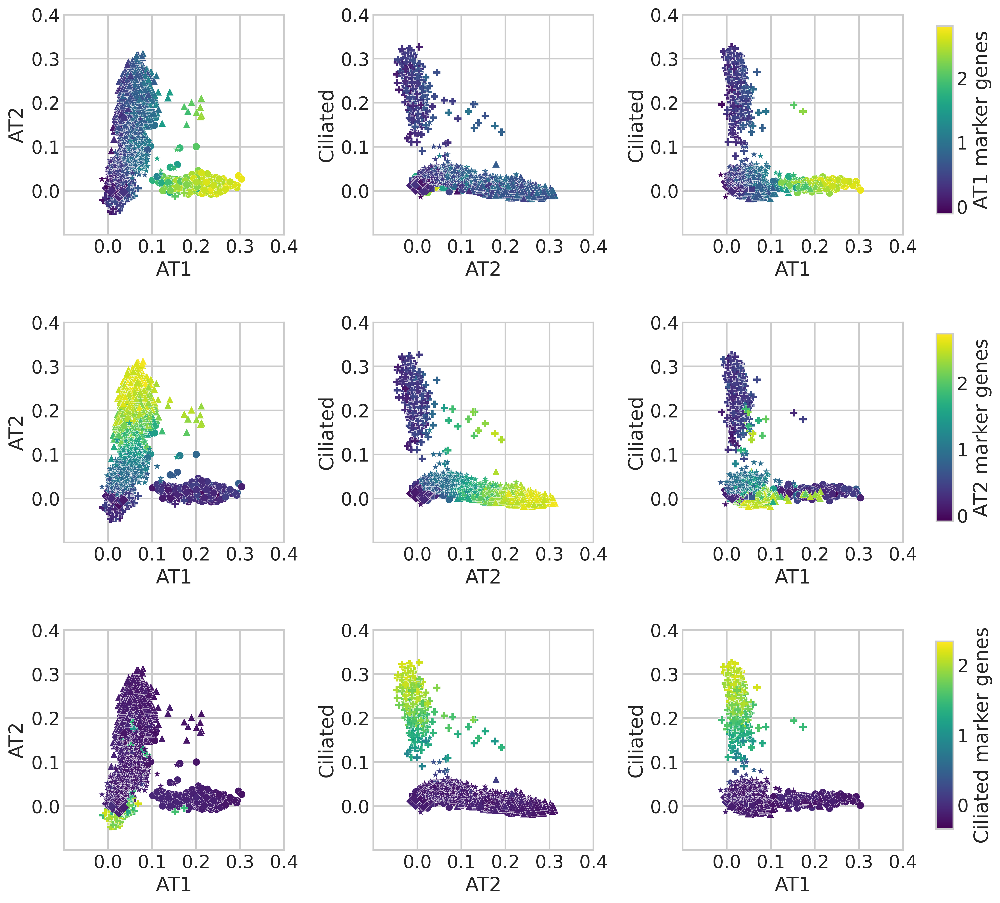

In [21]:
size_scale = 4
fig, axes = plt.subplots(3, 4, figsize=(4*size_scale,3*size_scale))
axes_list = axes.flatten()

type1 = 'Lung AT1 Cell WK6-10 MC20'
type2 = 'Lung AT2 Cell WK6-10 MC20'
type3 = 'Lung Ciliated Cell WK6-10 MC20'
markersize = plt.rcParams['lines.markersize'] **1.75
bounds = [-0.1, 0.35]
condition = source_annotations=='Control'

type_pairs = [[type1, type2], [type2, type3], [type1, type3]]
axis_index = 0
for current_signature in type_signatures.keys():
    type_signature = type_signatures[current_signature]
    hue_norm = (min(type_signature), max(type_signature))
    
    for typeX, typeY in type_pairs:
        ax = axes_list[axis_index]
        for cell_type in color_dict.keys():
            subset = np.logical_and(type_annotations==cell_type, condition)
            current_data = projections_herriges.loc[:,subset]

            label = cell_type
            if 'like' in label:
                label = label[:label.index(' and')]

            sns.scatterplot(x=current_data.loc[typeX],
                            y=current_data.loc[typeY],
                            hue=type_signature.loc[subset],
                            hue_norm = hue_norm,
                            legend=False,
                            palette='viridis',
                            marker = marker_dict[cell_type],
                            linewidth=0.15,
                            s = markersize,
                            ax=ax,
                            label=label
                           )

        ax.set(xlabel = label_dict[typeX],
               ylabel = label_dict[typeY],
               xlim = bounds,
               ylim = bounds,
               aspect = 'equal',
               xticks = np.arange(5)/10.,
               yticks = np.arange(5)/10.,
              )
#         ax.grid()

        if axis_index in [2, 6, 10]:
            axis_index += 1
#             ax = axes_list[axis_index]
#             cb_ax.ax.set_axis_on()
            
        axis_index += 1
    
plt.tight_layout()

for current_signature, axis_index in zip(type_signatures.keys(), [3, 7, 11]):
    type_signature = type_signatures[current_signature]
    hue_norm = (min(type_signature), max(type_signature))
    
    ax = axes_list[axis_index]
    cmap = create_colorbar(hue_norm, current_signature,
                               colormap='viridis', cax = ax)
    
    bbox=ax.get_position()
    ax.set_position([bbox.x0-0.125, bbox.y0+0.03, bbox.x1 - bbox.x0, (bbox.y1 - bbox.y0)*0.8], which='both')
    ax.set_aspect(4)
    

plt.savefig("./manuscript figures/fig2a_2D_signatures.png", transparent=True, bbox_inches = "tight")
plt.show()

# Figure 2 (b)

In [22]:
import h5py

fname = '/projectnb/biophys/mariay/scTOP_manuscript_data/Brain Atlas/Analysis_Zeng_Hippocampus_10X/data/10x_v2/mouse/processed/YaoHippo2020/CTX_Hip_counts_10x.h5'
h5f = h5py.File(fname,'r')
genes = np.array(h5f['data/gene'].asstr())
annotations = pd.read_csv('/projectnb/biophys/mariay/scTOP_manuscript_data/Brain Atlas/Analysis_Zeng_Hippocampus_10X/data/10x_v2/mouse/processed/YaoHippo2020/CTX_Hip_anno_10x/CTX_Hip_anno_10x.csv')
annotations = annotations.set_index('sample_name')

h5_names = np.array(h5f['data/samples']).astype(str)

In [254]:
# Create a basis according to the given specifier
from tqdm import tqdm

specifier = 'subclass_label'
classes, class_counts = np.unique(annotations.loc[:, specifier], return_counts=True)
class_basis_array = []

# Take [num_cells] random cells from each subclass and use them to create the basis
num_cells = 200
# Keep track of the cells used to create the basis to make sure they're not used in the "test" set
training_indices = []

for current_class, current_count in tqdm(zip(classes, class_counts)):
    condition = annotations.loc[:, specifier] == current_class
    
    if current_count >= num_cells:
        random_indices = np.random.choice(np.where(condition)[0], size=num_cells, replace=False)
        converted_indices = []
        
        # Convert from annotation indices to h5 file indices
        for index in random_indices:
            converted_indices += [np.where(h5_names == annotations.index[index])[0][0]]
        
        converted_indices = np.array(converted_indices)
        converted_indices.sort()
            
        current_dataframe = pd.DataFrame(h5f['data/counts'][:,  converted_indices], index = genes)
        class_basis_array += [top.process(current_dataframe, average=True)]
        training_indices = np.append(training_indices, random_indices)

class_basis = pd.concat(class_basis_array, axis='columns')
class_basis.columns = classes[class_counts>=num_cells]

class_basis.to_csv('./manuscript data/brain_atlas.csv')
pd.DataFrame(training_indices).to_csv('./manuscript data/brain_atlas_training_indices.csv')

42it [28:55, 41.32s/it]


Once the above has been run once, import the files created instead of running again:

In [23]:
specifier = 'subclass_label'
class_basis = pd.read_csv('./manuscript data/brain_atlas.csv')
training_indices = pd.read_csv('./manuscript data/brain_atlas_training_indices.csv')

class_basis = class_basis.set_index('Unnamed: 0')
training_indices = training_indices.loc[:,'0'].values

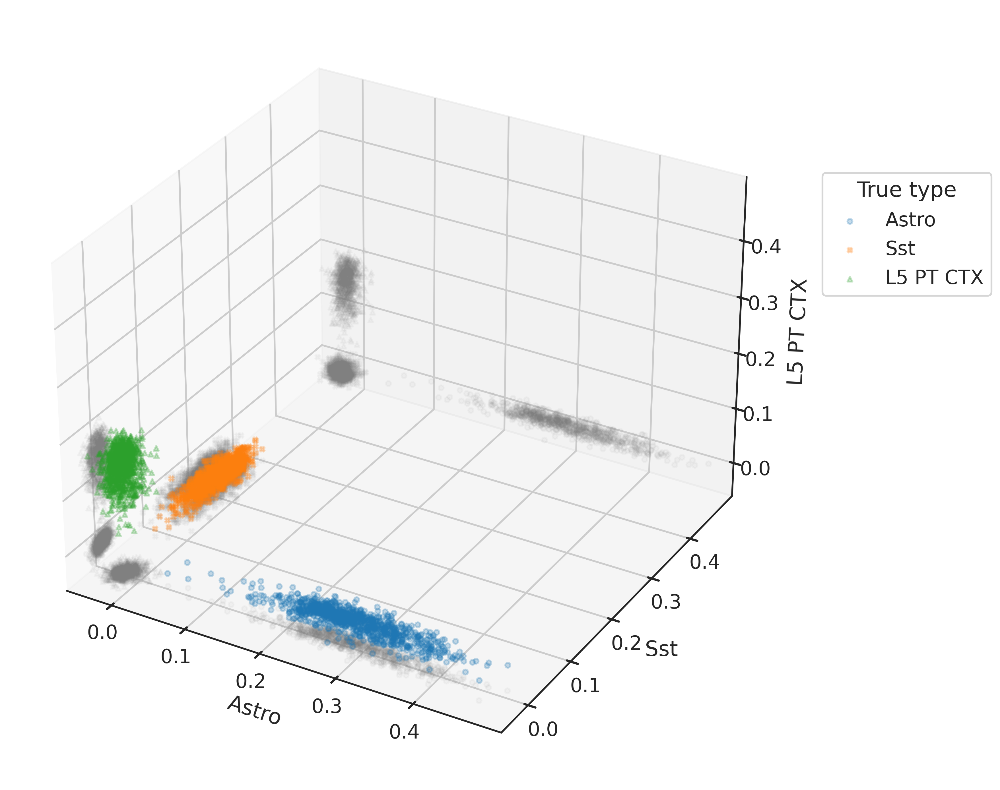

In [21]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1, 1, 1, projection='3d')

type1 = populations[0]
type2 = populations[1]
type3 = populations[2]
markersize = plt.rcParams['lines.markersize'] * 2
bounds = [-0.05, 0.5]

marker_dict = {type1: 'o',
               type2: 'X',
               type3: '^'
              }


for population in populations:
    scores = population_scores[population]
    
    kwargs = {'s':markersize,
              'marker':marker_dict[population]
             }
    
    ax.scatter(scores.loc[type1], scores.loc[type2], scores.loc[type3],
               alpha=0.25, label=population, **kwargs)
    
    
    ax.scatter(scores.loc[type1],
               np.full_like(scores.loc[type2], bounds[1]),
               scores.loc[type3],
               color='grey', alpha=0.05, **kwargs)
    ax.scatter(scores.loc[type1],
               scores.loc[type2],
               np.full_like(scores.loc[type3], bounds[0]),
               color='grey', alpha=0.05, **kwargs)
    ax.scatter(np.full_like(scores.loc[type1], bounds[0]),
               scores.loc[type2],
               scores.loc[type3],
               color='grey', alpha=0.05, **kwargs)

ax.set_xlabel(type1, labelpad=10)
ax.set_ylabel(type2, labelpad=10)
ax.set_zlabel(type3, labelpad=10)
# ax.tick_params(axis='both', which='both', pad=0)#labelbottom=False, labeltop=False, labelright=False, labelleft=False)
ax.set_xticks(np.arange(5)/10.)
ax.set_yticks(np.arange(5)/10.)
ax.set_zticks(np.arange(5)/10.)

ax.set_xlim(bounds)
ax.set_ylim(bounds)
ax.set_zlim(bounds)

plt.legend(bbox_to_anchor=(1.04,0.8), loc="upper left", title='True type')

# plt.savefig("./manuscript figures/fig2b_projections.pdf", transparent=True, bbox_inches = "tight")

plt.show()

Since there are over a million cells, the scores are found then averaged using the BU computing cluster.

In [25]:
population_scores = pd.read_csv('/project/biophys/mouse scRNA-seq/scTOP explorations/scTOP/manuscript/manuscript data/brain_atlas_bubbleplot.csv')
population_scores = population_scores.set_index('Unnamed: 0')

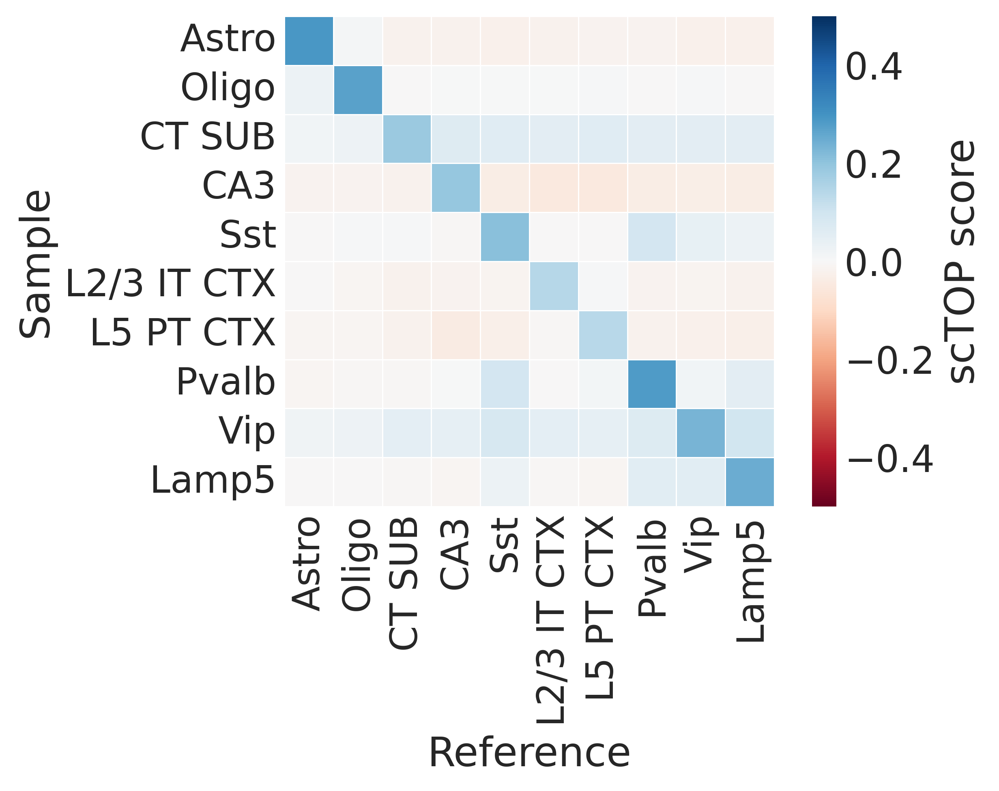

In [26]:
sns.heatmap(population_scores.T, cmap="RdBu", 
            vmin=-0.5, vmax=0.5, 
            linewidths=.5, square=True, cbar_kws={'label':'scTOP score'})
plt.xlabel('Reference')
plt.ylabel('Sample')
plt.savefig("./manuscript figures/fig2b_brain_heatmap.pdf", bbox_inches = "tight")
plt.show()

In [32]:
# Choose three populations to plot
populations = ['Astro', 'Sst', 'L5 PT CTX']
population_scores = dict()

for population in tqdm(populations):
    # Random sample of indices for population type, excluding indices used for training data
    current_condition = annotations.loc[:, specifier] == population
    index_options = np.setdiff1d(np.where(current_condition)[0], training_indices)
    random_indices = np.random.choice(index_options, size=1000, replace=False)
    converted_indices = []
    for index in random_indices:
        converted_indices += [np.where(h5_names == annotations.index[index])[0][0]]

    converted_indices = np.array(converted_indices)
    converted_indices.sort()
    current_sample = pd.DataFrame(h5f['data/counts'][:,  converted_indices], index = genes)
    processed_sample = top.process(current_sample, average=False)
    current_scores = top.score(class_basis, processed_sample)
    population_scores[population] = current_scores

100%|██████████| 3/3 [10:05<00:00, 201.76s/it]


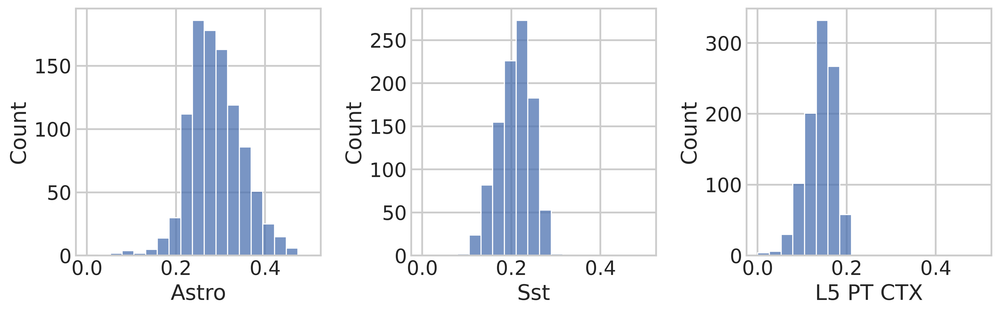

In [43]:
fig = plt.figure(figsize=(12,4))

bounds = [-0.05, 0.5]
bins = np.linspace(0, 0.5, 20)

for index, population in enumerate(populations):
    ax = fig.add_subplot(1, 3, index+1)
    scores = population_scores[population]
    
    sns.histplot(scores.loc[population], ax=ax, bins = bins)
    ax.set_xlabel('{}'.format(population))

plt.tight_layout()
plt.savefig("./manuscript figures/fig2b_distributions.pdf", bbox_inches = "tight")
plt.show()

In [2]:
# Calculate median F1 score using the lists of predicted and true labels

from sklearn.metrics import f1_score

label_lists = pd.read_csv('/project/biophys/mouse scRNA-seq/scTOP explorations/scTOP/manuscript/manuscript data/brain_atlas_predicted_labels.csv')

labels = label_lists.drop(columns='Unnamed: 0')
labels.index = ['true', 'predicted', 'predicted specified']

/scratch/154808.1.ood/ipykernel_13823/896040794.py:5: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  label_lists = pd.read_csv('/project/biophys/mouse scRNA-seq/scTOP explorations/scTOP/manuscript/manuscript data/brain_atlas_predicted_labels.csv')


In [4]:
# Find f1 scores for each class (cell type)
f1s = f1_score(y_true = labels.loc['true'],
               y_pred = labels.loc['predicted'],
               average = None
              )

print('Median F1: {}'.format(np.median(f1s)))

# # Find f1 scores when scores < 0.1 are labeled as "unspecified"
f1s_specified = f1_score(y_true = labels.loc['true'],
                         y_pred = labels.loc['predicted specified'],
#                          labels = np.unique(labels.loc['true']),
                         average = None
                        )

print('Median F1 (specified): {}'.format(np.median(f1s_specified)))

Median F1: 0.8815859191942299
Median F1 (specified): 0.8758843743683041


# Tabula Muris & MCA

In [6]:
tm_directory = '/projectnb/biophys/mariay/scTOP_manuscript_data/Tabula Muris/'
annotations = pd.read_csv(tm_directory + 'annotations_facs.csv', low_memory=False)
metadata = pd.read_csv(tm_directory + 'metadata_FACS.csv')

In [7]:
immune_cells_TM = ['B cell',
                   'T cell',
                   'NK cell',
                   'natural killer cell',
                   'blood cell',
                   'basophil',
                   'progenitor',
                   'granulocyt',
                   'monocyte',
                   'leukocyte',
                   'lymphocyte',
                   'macrophage',
                   'professional antigen presenting cell',
                   'stem cell'
                  ]
immune_cell_IDs = (annotations.loc[:, 'cell']
                   [annotations.loc[:, 'cell_ontology_class']
                    .str.contains("|".join(immune_cells_TM), na=False)])

In [8]:
import glob
files = glob.glob(tm_directory + 'FACS/' + '*.csv')

types = []
type_profiles = []

for file in files:
    current_type = file[file.index('FACS/')+len('FACS/'):file.index('-counts')]
    current_type = current_type.replace('_', ' ')
    types.append(current_type)
    current_sample = pd.read_csv(file)
    current_sample = current_sample.set_index('Unnamed: 0')
    print(current_type + ' cells before: ' + str(len(current_sample.columns)))
    # Drop immune and blood cells, because those are present throughout the body
    # and do not specify according to tissue
    current_sample = current_sample.drop(columns=immune_cell_IDs, errors='ignore')
    print(current_type + ' cells after: ' + str(len(current_sample.columns)))
    processed_sample = top.process(current_sample, average=True)
    type_profiles.append(processed_sample)
    
tm_basis = pd.concat(type_profiles, axis='columns')
tm_basis.columns = types

Fat cells before: 5862
Fat cells after: 2788
Thymus cells before: 1580
Thymus cells after: 231
Large Intestine cells before: 4149
Large Intestine cells after: 4149
Heart cells before: 6002
Heart cells after: 5479
Aorta cells before: 1113
Aorta cells after: 1054
Marrow cells before: 5355
Marrow cells after: 583
Tongue cells before: 1432
Tongue cells after: 1432
Bladder cells before: 1638
Bladder cells after: 1638
Trachea cells before: 1391
Trachea cells after: 1185
Brain Non-Myeloid cells before: 5799
Brain Non-Myeloid cells after: 5799
Diaphragm cells before: 951
Diaphragm cells after: 159
Lung cells before: 1923
Lung cells after: 1586
Mammary Gland cells before: 2663
Mammary Gland cells after: 2663
Liver cells before: 981
Liver cells after: 901
Pancreas cells before: 1961
Pancreas cells after: 1907
Skin cells before: 2464
Skin cells after: 992
Spleen cells before: 1718
Spleen cells after: 21
Brain Myeloid cells before: 4762
Brain Myeloid cells after: 4701
Kidney cells before: 865
Kidn

In [9]:
style_dict = {'Bladder': ['o', 'tab:blue'],
              'Heart': ['v', 'tab:red'],
              'Kidney': ['P', 'tab:orange'],
              'Liver': ['*', 'tab:green'],
              'Lung': ['^', 'tab:purple'],
              'Mammary Gland': ['X', 'tab:brown'],
              'Pancreas': ['<', 'tab:pink'],
              'Skin': ['D', 'tab:gray'],
              'Spleen': ['>', 'tab:olive'],
              'Thymus': ['p', 'tab:cyan']
             }

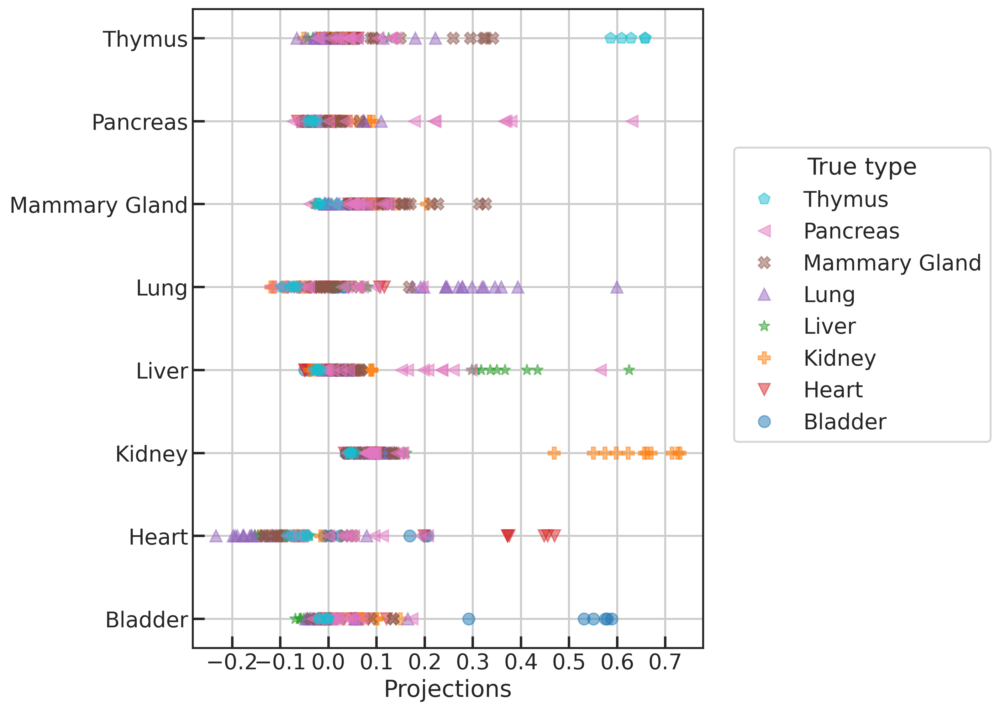

In [10]:
fig = plt.figure(figsize=(7,9))
shared_organs = np.intersect1d(tm_basis.columns, np.unique(basis_metadata['Organ']))
shared_organs = [organ for organ in shared_organs if organ not in ['Skin', 'Spleen']] # The skin cells are all P1, so don't include them

ax = fig.add_subplot(1, 1, 1)

for organ in shared_organs:
    mca_types = basis_metadata.index[basis_metadata['Organ']==organ]
#     mca_types = [cell_type for cell_type in mca_types if 'P1' not in cell_type] # Exclude P1
    mca_profiles = basis.loc[:, mca_types]
    scores = top.score(tm_basis, mca_profiles)
    ax.plot(scores.loc[shared_organs].values, shared_organs,
            marker=style_dict[organ][0], color=style_dict[organ][1], label=organ,
            lw=0, alpha=0.5)
    
ax.set_xlabel('Projections')
ax.set_xticks(np.arange(-2,8)/10.)
ax.grid()

# Manually remove duplicate labels
handles, labels = plt.gca().get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
plt.legend(reversed(unique_labels.values()), reversed(unique_labels.keys()), bbox_to_anchor=(1.04,0.8), loc="upper left", title='True type')
plt.savefig("./manuscript figures/fig2c_projections.pdf", transparent=True, bbox_inches = "tight")
plt.show()

In [10]:
immune_cells = ['Beta Cell',
                'Macrophage',
                'Neutrophil',
                'Erythroblast',
                'T Cell',
                'B Cell',
                'Dendritic Cell',
                'NK Cell',
                'Natural Kill',
                'Monocyte',
#                 'P1', # Also exclude early cell types, they often look like something else
                'Stem',
                'Pregnancy',
                'High'
               ]

In [14]:
# mca_scores_list = []

shared_organs = np.intersect1d(tm_basis.columns, np.unique(basis_metadata['Organ']))
# Exclude skin because it's mostly P1
# Exclude thymus and spleen because they're mostly immune cells
shared_organs = [organ for organ in shared_organs if organ not in ['Skin', 'Spleen', 'Thymus', 'Pancreas']]

# for organ in shared_organs:
#     current_types = basis_metadata.index[basis_metadata['Organ']==organ]
#     types_to_drop = current_types.str.contains("|".join(immune_cells))
#     current_types = current_types[np.logical_not(types_to_drop)]
    
#     # Only take [number_types] of each type, to make a reasonably-sized plot
#     number_types = 2
#     current_types = np.random.choice(current_types, number_types, replace=False)
    
#     mca_profiles = basis.loc[:, current_types]
#     scores = top.score(tm_basis, mca_profiles)
#     mca_scores_list.append(scores)
    
# mca_scores = pd.concat(mca_scores_list, axis=1)

types_to_show = {'Bladder Epithelial Cell WK6-10 MC20': 'Bladder epithelium',
                 'Bladder Mesenchymal Stromal Cell WK6-10 MC20': 'Bladder mesenchyme',
                 'Heart Left Ventricle Cardiomyocyte P1 MC20': 'Cardiomyocyte',
                 'Heart Smooth Muscle Cell P1 MC20': 'Heart muscle',
                 'Kidney Proximal Tubule Brush Border Cell WK6-10 MC20': 'Kidney brush border',
                 'Kidney Stromal Cell WK6-10 MC20': 'Kidney stroma',
                 'Liver Endothelial Cell WK6-10 MC20': 'Liver endothelium',
                 'Liver Hepatocyte WK6-10 MC20': 'Hepatocyte',
                 'Lung Endothelial Cell WK6-10 MC20': 'Lung endothelium',
                 'Lung Club Cell WK6-10 MC20': 'Lung club',
                 'Mammary Gland Muscle Cell WK6-10 MC20': 'Mammary muscle',
                 'Mammary Gland Stromal Cell WK6-10 MC20': 'Mammary stroma'
                }

mca_profiles = basis.loc[:, types_to_show.keys()]
mca_scores = top.score(tm_basis, mca_profiles)
new_cols = [types_to_show[col] for col in mca_scores.columns]
mca_scores.columns = new_cols

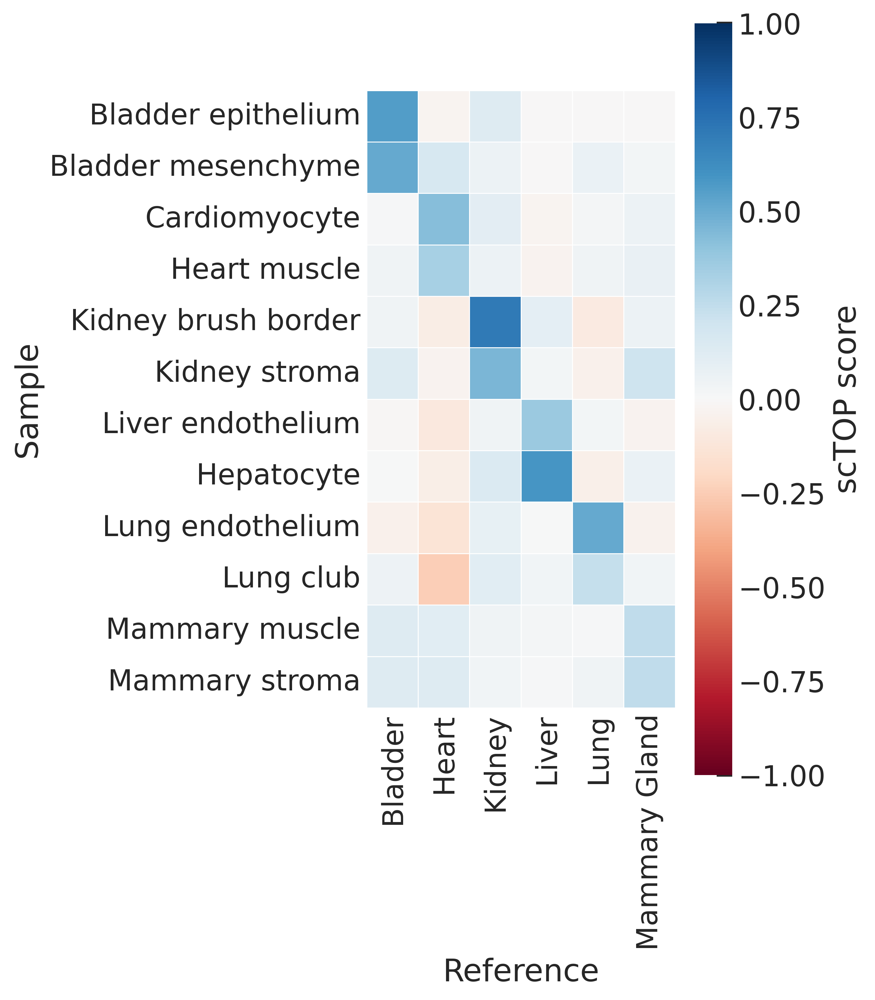

In [19]:
plt.figure(figsize=(4, 8))
sns.heatmap(mca_scores.loc[shared_organs].T, cmap="RdBu", 
            vmin=-1, vmax=1, 
            linewidths=.5, square=True, cbar_kws={'label':'scTOP score'})
plt.xlabel('Reference')
plt.ylabel('Sample')

plt.savefig("./manuscript figures/tabula_muris_heatmap.pdf", bbox_inches = "tight")
plt.show()

In [29]:
shared_organs = np.intersect1d(tm_basis.columns, np.unique(basis_metadata['Organ']))
# Exclude skin because it's mostly P1
# Exclude thymus and spleen because they're mostly immune cells
shared_organs = [organ for organ in shared_organs if organ not in ['Skin', 'Spleen', 'Thymus']]
types_to_drop = basis.columns.str.contains("|".join(immune_cells))
basis_without_immune = basis.loc[:, np.logical_not(types_to_drop)]

mca_scores = top.score(tm_basis, basis_without_immune)

included_types_accuracies = {'top1': 0,
                             'top3': 0,
                             'unspecified': 0,
                             'total_types': 0
                            }
excluded_types_accuracies = {'top1': 0,
                             'top3': 0,
                             'unspecified': 0,
                             'total_types': 0
                            }

misidentified_types = []

for cell_type, cell_scores in mca_scores.iteritems():
    true_tissue_list = [tissue for tissue in shared_organs if tissue in cell_type]
    
    if len(true_tissue_list) < 1:
        excluded_types_accuracies['total_types'] += 1
        
        if cell_scores.max() < 0.1:
            excluded_types_accuracies['unspecified'] += 1
    else:
        if len(true_tissue_list) > 1:
            print('Something went wrong in identifying the correct tissue')
            
        correct_type = true_tissue_list[0]
        included_types_accuracies['total_types'] += 1
        sorted_scores = cell_scores.sort_values(ascending=False)

        if sorted_scores.index[0] == correct_type:
            included_types_accuracies['top1'] += 1
        else:
            misidentified_types += [cell_type]
        if correct_type in sorted_scores.index[:3]:
            included_types_accuracies['top3'] +=1
        if sorted_scores[0] < 0.1:
            included_types_accuracies['unspecified'] +=1

In [30]:
print(included_types_accuracies)
print(excluded_types_accuracies)

{'top1': 38, 'top3': 42, 'unspecified': 0, 'total_types': 48}
{'top1': 0, 'top3': 0, 'unspecified': 0, 'total_types': 81}


In [31]:
misidentified_types

['Liver Granulocyte WK6-10 MC20',
 'Lung Nuocyte WK6-10 MC20',
 'Lung Eosinophil Granulocyte WK6-10 MC20',
 'Pancreas Stromal Cell WK6-10 MC20',
 'Pancreas Endothelial Cell WK6-10 MC20',
 'Mammary Gland Endothelial Cell WK6-10 MC20',
 'Mammary Gland Dividing Cell WK6-10 MC20',
 'Pancreas Acinar Cell P1 MC20',
 'Pancreas Ductal Cell P1 MC20',
 'Pancreas Lymphatic Vessel Endothelial Cell P1 MC20']